<a href="https://colab.research.google.com/github/syamkakarla98/Face_Recognition_Using_Convolutional_Neural_Networks/blob/master/CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/MyDrive/ProjectFaces'

Mounted at /content/drive
/content/drive/MyDrive/ProjectFaces


In [2]:
# prompt: hiện thông tin cấu hình máy chủ

!nvidia-smi


Sun Apr 14 08:45:25 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
# prompt: #prompt: hiện thông tin cấu hình máy chủ

!cat /proc/cpuinfo


processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 85
model name	: Intel(R) Xeon(R) CPU @ 2.00GHz
stepping	: 3
microcode	: 0xffffffff
cpu MHz		: 2000.190
cache size	: 39424 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm mpx avx512f avx512dq rdseed adx smap clflushopt clwb avx512cd avx512bw avx512vl xsaveopt xsavec xgetbv1 xsaves arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmi

In [4]:
# prompt: hiện thông tin máy chủ

!hostname


92681f88ae13


In [7]:
# prompt: hiện đầy đủ cpu gpu luôn
import torch
# Check if GPU is available
if not torch.cuda.is_available():
  print("GPU is not available.")
else:
  # Set device to GPU
  device = torch.device("cuda")
  print("GPU is available. Setting device to GPU.")

# Print the current device
print("Current device:", device)


GPU is available. Setting device to GPU.
Current device: cuda


In [8]:
import tensorflow as tf

from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import ReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [10]:
# prompt: bật gpu

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))


Found GPU at: /device:GPU:0


In [11]:
# Reading Data
df = pd.read_csv('Datasets.csv', index_col=0)
df

,pix-2,pix-3,pix-4,pix-5,pix-6,pix-7,pix-8,pix-9,pix-10,pix-11,...,pix-9992,pix-9993,pix-9994,pix-9995,pix-9996,pix-9997,pix-9998,pix-9999,pix-10000,class
pix-1,,,,,,,,,,,,,,,,,,,,,
28,27,33,35,34,37,34,30,27,26,22,...,119,120,120,120,120,119,119,119,119,1
36,42,41,40,40,38,37,34,30,28,24,...,135,135,135,135,135,135,135,135,135,1
38,35,34,33,33,34,31,26,24,23,22,...,126,126,125,125,126,126,126,126,126,1
48,32,31,37,34,33,33,36,32,28,27,...,133,134,130,128,127,127,126,125,125,1
95,73,52,35,33,35,34,31,32,33,31,...,134,132,126,124,125,125,125,125,125,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,93,65,58,55,57,49,47,45,43,41,...,140,148,146,145,146,144,143,146,149,3
101,71,57,55,55,53,44,41,40,41,40,...,147,145,145,144,143,144,147,150,152,3
133,133,129,108,72,57,57,47,45,44,40,...,140,151,145,143,143,142,144,147,148,3


In [12]:
df['class'] = df['class'] - 1

In [13]:
X = df.iloc[:, :100*100].values.reshape(-1, 100, 100, 1)
y = df.iloc[:, -1].values
labels = y
y

array([0, 0, 0, ..., 2, 2, 2])

In [14]:
X.shape, y.shape

((5550, 100, 100, 1), (5550,))

In [15]:
num_classes = 2

In [16]:
# y = to_categorical(y, num_classes= 1+ df.loc[:, 'class'].unique().shape[0])
# y[0].shape

In [17]:
# One Hot Encoding the labels

y = to_categorical(y, num_classes= df.loc[:, 'class'].unique().shape[0])
y[0].shape


(3,)

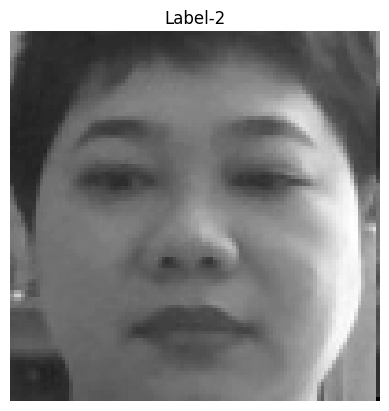

In [18]:
# random Image
q = np.random.randint(len(X))
# q = np.random.randint(X.shape[0])
plt.imshow(X[q][:,:,0], cmap='gray')
plt.title(f'Label-{labels[q]}')
plt.axis('off')
plt.show()

In [20]:
# X_processed = np.array(X_processed)
X_train,X_test,y_train,y_test=train_test_split(X, y, random_state=42, test_size=0.3)

print(f'Train Size - {X_train.shape}\nTest Size - {X_test.shape}')


Train Size - (3885, 100, 100, 1)
Test Size - (1665, 100, 100, 1)


In [21]:
from datetime import datetime

In [22]:
# Artificially increase training set
train_datagen = ImageDataGenerator(rescale=1./255.,
                                   rotation_range=10,
                                   width_shift_range=0.25,
                                   height_shift_range=0.25,
                                   shear_range=0.1,
                                   zoom_range=0.25,
                                   horizontal_flip=False)

valid_datagen = ImageDataGenerator(rescale=1./255.)

In [23]:
from datetime import datetime


In [24]:

num_classes = 3
model_name = 'Face_trained_model_'+datetime.now().strftime("%H_%M_%S_")

In [25]:
# Test 1 kết quả khaS TỐT
from tensorflow.keras import models
from tensorflow.keras.layers import Activation, ZeroPadding2D, MaxPooling2D, Conv2D, Flatten, Dense, Dropout
from tensorflow.keras import regularizers, constraints

model = Sequential(name = model_name)

model.add(Conv2D(32, kernel_size=(num_classes, num_classes), activation='linear', input_shape=(100, 100, 1), padding='same'))
model.add(MaxPooling2D((2, 2)))

model.add(Conv2D(64, (num_classes, num_classes), activation='relu', kernel_regularizer=regularizers.l2(l2=0.01)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (num_classes, num_classes), activation='relu', kernel_regularizer=regularizers.l2(l2=0.01)))


model.add(Flatten())

model.add(Dense(512, activation='relu', kernel_initializer="glorot_uniform", kernel_regularizer=regularizers.l2(l2=0.01)))
# Use the MCDropout layer from the tensorflow_addons module
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax', kernel_initializer="glorot_uniform"))
model.summary()

Model: "Face_trained_model_08_46_37_"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 100, 100, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 50, 50, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 48, 48, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 24, 24, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 128)       73856     
                                                                 
 flatten (Flatten)           (None, 61

In [26]:
# model = Sequential(name = model_name)

# model.add(Conv2D(64, kernel_size=3, activation='relu', input_shape=(100, 100, 1)))
# model.add(BatchNormalization()) #----------------
# model.add(Conv2D(64, kernel_size=3, activation='relu'))
# model.add(BatchNormalization()) #----------------
# model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu'))
# model.add(BatchNormalization()) #----------------
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2)) #----------------

# model.add(Conv2D(128, kernel_size=3, activation='relu'))
# model.add(BatchNormalization())
# model.add(Conv2D(128, kernel_size=3, activation='relu'))
# model.add(BatchNormalization())
# model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu'))
# model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

# model.add(Conv2D(256, kernel_size=3, activation='relu'))
# model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

# model.add(Flatten())
# model.add(Dense(256))
# model.add(BatchNormalization())
# model.add(Dense(128))
# model.add(BatchNormalization())
# model.add(Dense(3, activation='softmax'))

# model.summary()

In [27]:

# model = Sequential(name = model_name)

# model.add(Conv2D(64, kernel_size=3, activation='relu', input_shape=(100, 100, 1)))
# model.add(BatchNormalization()) #----------------
# model.add(Conv2D(64, kernel_size=3, activation='relu'))
# model.add(BatchNormalization()) #----------------
# model.add(Conv2D(64, kernel_size=4, padding='same', activation='relu'))
# model.add(BatchNormalization()) #----------------
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2)) #----------------

# model.add(Conv2D(128, kernel_size=3, activation='relu'))
# model.add(BatchNormalization())
# model.add(Conv2D(128, kernel_size=3, activation='relu'))
# model.add(BatchNormalization())
# model.add(Conv2D(128, kernel_size=4, padding='same', activation='relu'))
# model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

# model.add(Conv2D(256, kernel_size=3, activation='relu'))
# model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

# model.add(Flatten())
# model.add(Dense(256))
# model.add(BatchNormalization())
# model.add(Dense(128))
# model.add(BatchNormalization())
# model.add(Dense(4, activation='softmax'))

# model.summary()

In [28]:

learning_rate = 0.001
optimizer = RMSprop(learning_rate=learning_rate)

model.compile(loss='categorical_crossentropy',optimizer=optimizer,metrics=['accuracy'])

In [29]:
# from tensorflow.keras import optimizers, losses
# from tensorflow.keras.callbacks import EarlyStopping
# early_stopping = EarlyStopping()
# model.compile(
#     loss=losses.CategoricalCrossentropy(from_logits=True),
#     optimizer=optimizers.Adam(learning_rate=0.0003),
#     metrics=["accuracy"]
# )

In [30]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=200,
                                            verbose=1,
                                            factor=0.2)

ch = ModelCheckpoint('models/'+model_name+'.h5', monitor='val_accuracy', verbose=0, save_best_only=True, mode='max')

es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=200)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs/"+datetime.now().strftime("%Y%m%d-%H%M%S"))


In [31]:
# ls

In [32]:
# epochs = 50
# batch_size = 256
# history = model.fit_generator(train_datagen.flow(X_train, y_train, batch_size=batch_size),
#                               steps_per_epoch= X_train.shape[0]//batch_size,
#                               epochs=epochs,
#                               validation_data=valid_datagen.flow(X_test, y_test),
#                               validation_steps=50,
#                               verbose = 1,
#                               callbacks=[learning_rate_reduction, es, ch, tensorboard_callback])
epochs = 50
batch_size = 256


history = model.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              steps_per_epoch= X_train.shape[0]//batch_size,
                              epochs=epochs,
                              validation_data=valid_datagen.flow(X_test, y_test),
                              validation_steps=50,
                              verbose = 1,
                              callbacks=[learning_rate_reduction, es, ch, tensorboard_callback])

Epoch 1/50
15/15 [==============================] - ETA: 0s - loss: 7.3771 - accuracy: 0.4266

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15/15 [==============================] - 14s 603ms/step - loss: 7.3771 - accuracy: 0.4266 - val_loss: 3.6079 - val_accuracy: 0.5394 - lr: 0.0010
Epoch 2/50
15/15 [==============================] - 11s 733ms/step - loss: 2.7277 - accuracy: 0.4922 - val_loss: 1.7417 - val_accuracy: 0.9519 - lr: 0.0010
Epoch 3/50
15/15 [==============================] - 4s 287ms/step - loss: 1.5112 - accuracy: 0.6861 - val_loss: 0.8478 - val_accuracy: 0.8988 - lr: 0.0010
Epoch 4/50
15/15 [==============================] - 7s 508ms/step - loss: 1.2389 - accuracy: 0.7214 - val_loss: 0.7242 - val_accuracy: 0.9556 - lr: 0.0010
Epoch 5/50
15/15 [==============================] - 6s 436ms/step - loss: 0.9053 - accuracy: 0.8046 - val_loss: 0.5528 - val_accuracy: 0.9794 - lr: 0.0010
Epoch 6/50
15/15 [==============================] - 5s 336ms/step - loss: 0.8237 - accuracy: 0.7975 - val_loss: 0.5276 - val_accuracy: 0.9206 - lr: 0.0010
Epoch 7/50
15/15 [==============================] - 7s 459ms/step - loss: 0.773

In [33]:
loss, acc = model.evaluate(valid_datagen.flow(X_test, y_test))

print(f'Loss: {loss}\nAccuracy: {acc*100}')

53/53 [==============================] - 1s 9ms/step - loss: 0.1085 - accuracy: 0.9988
Loss: 0.10848040133714676
Accuracy: 99.87987875938416


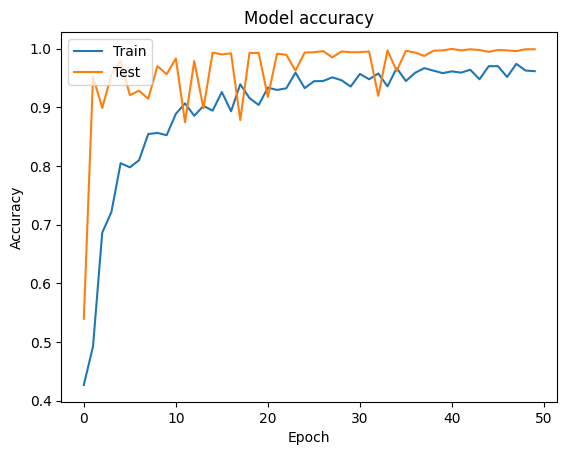

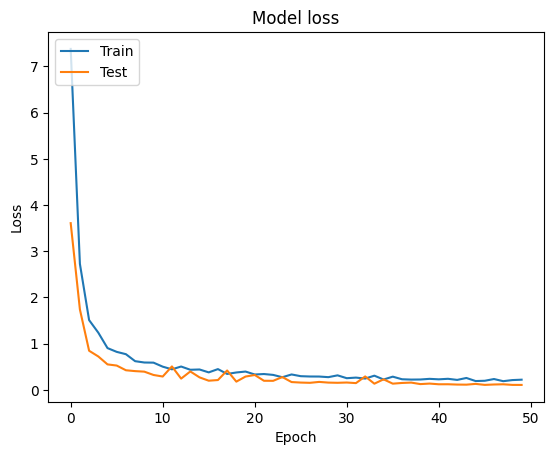

In [34]:
# Plot training & test accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & test loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [35]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [36]:
from sklearn.metrics import classification_report

print(classification_report(np.argmax(y_test, axis=1), np.argmax(model.predict(X_test),axis=1)))

53/53 [==============================] - 1s 7ms/step
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       577
           1       0.96      1.00      0.98       507
           2       1.00      0.91      0.95       581

    accuracy                           0.96      1665
   macro avg       0.96      0.96      0.96      1665
weighted avg       0.96      0.96      0.96      1665



53/53 [==============================] - 0s 8ms/step


<Axes: xlabel='Predicted', ylabel='Actual'>

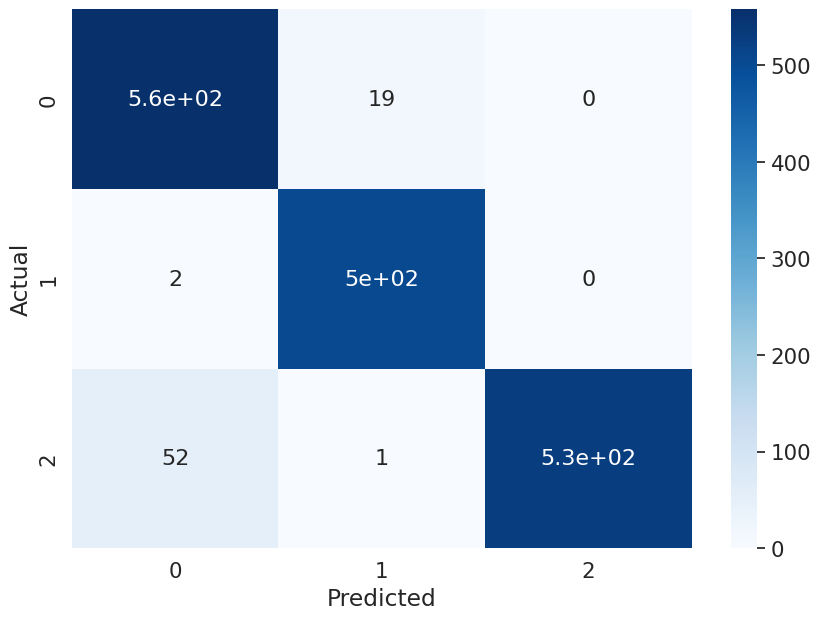

In [37]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score
import seaborn as sn
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(model.predict(X_test), axis=1)
data = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(data, columns=np.unique(y_true), index = np.unique(y_true))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

In [38]:
print(f1_score(y_true, y_pred, average="macro")*100)
print(precision_score(y_true, y_pred, average="macro")*100)
print(recall_score(y_true, y_pred, average="macro")*100)

95.64984122717158
95.7889822595705
95.73014176785883


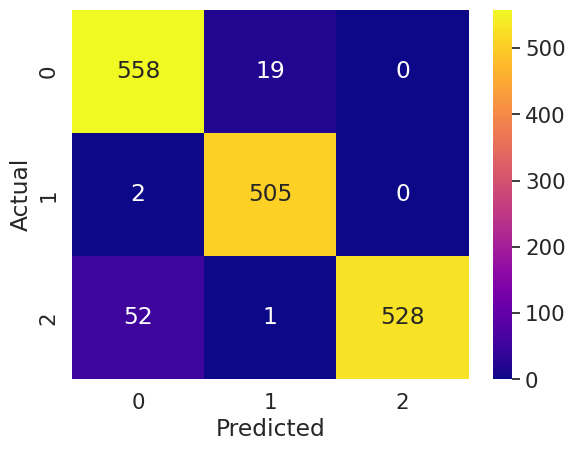

In [39]:
sn.heatmap(df_cm, annot=True, fmt="d", cmap="plasma");


In [40]:
import time
from datetime import datetime

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, cohen_kappa_score
def AA_andEachClassAccuracy(confusion_matrix):
    from operator import truediv
    counter = confusion_matrix.shape[0]
    list_diag = np.diag(confusion_matrix)
    list_raw_sum = np.sum(confusion_matrix, axis=1)
    each_acc = np.nan_to_num(truediv(list_diag, list_raw_sum))
    average_acc = np.mean(each_acc)
    return each_acc, average_acc

def reports (nn_model, X_test,y_test):
    start = time.time()
    Y_pred = nn_model.predict(X_test)
    y_pred = np.argmax(Y_pred, axis=1)
    end = time.time()
    print(end - start)

    classification = classification_report(np.argmax(y_test, axis=1), y_pred, target_names=['1', '2','3'])
    target_names=['1', '2','3']
    oa = accuracy_score(np.argmax(y_test, axis=1), y_pred)
    confusion = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
    each_acc, aa = AA_andEachClassAccuracy(confusion)
    kappa = cohen_kappa_score(np.argmax(y_test, axis=1), y_pred)
    score = nn_model.evaluate(X_test, y_test, batch_size=32)
    Test_Loss =  score[0]
    Test_accuracy = score[1]*100

    return classification, confusion, Test_Loss, Test_accuracy, oa*100, '\n'.join([' : '.join(map(str, i)) for i in zip(target_names, each_acc*100)]), aa*100, kappa*100



classification, confusion, Test_loss, Test_accuracy, oa, each_acc, aa, kappa = reports(model, X_test, y_test)
classification = str(classification)
confusion = str(confusion)
file_name = "Face_Classification_report.txt"

with open(file_name, 'w') as x_file:
    x_file.write('\nTest loss: {}%'.format(Test_loss))
    x_file.write('\n')
    x_file.write('Test accuracy: {}%'.format(Test_accuracy))
    x_file.write('\n')
    x_file.write('\n')
    x_file.write('Kappa accuracy: {}%'.format(kappa))
    x_file.write('\n')
    x_file.write('Overall accuracy: {}%'.format(oa))
    x_file.write('\n')
    x_file.write('Average accuracy: {}%'.format(aa))
    x_file.write('\n\n')
    x_file.write('Classwise Accuracy: \n{}'.format(each_acc))
    x_file.write('\n\n')
    x_file.write('Classification Report:\n{}'.format(classification))
    x_file.write('\n\n')
    x_file.write('Confusion Matrix:\n{}'.format(confusion))

53/53 [==============================] - 0s 5ms/step
0.9682300090789795
53/53 [==============================] - 1s 7ms/step - loss: 13.9898 - accuracy: 0.9556


In [41]:
ls

batch_normalization_108.png  conv2d_7.png                     Face_trained_model_12_30_30_.h5
batch_normalization_109.png  conv2d_87.png                    Face_trained_model_12_58_43_.h5
batch_normalization_110.png  conv2d_88.png                    Face_trained_model_23_58_58_.h5
batch_normalization_111.png  conv2d_89.png                    logs/
batch_normalization_112.png  conv2d_8.png                     max_pooling2d_11.png
batch_normalization_113.png  conv2d_90.png                    max_pooling2d_12.png
batch_normalization_114.png  conv2d_91.png                    max_pooling2d_13.png
batch_normalization_1.png    conv2d_92.png                    max_pooling2d_1.png
batch_normalization_27.png   conv2d_93.png                    max_pooling2d_27.png
batch_normalization_28.png   conv2d_94.png                    max_pooling2d_28.png
batch_normalization_29.png   conv2d.png                       max_pooling2d_29.png
batch_normalization_2.png    Dataset.csv                      max_pool

1/1 [==============================] - 0s 22ms/step


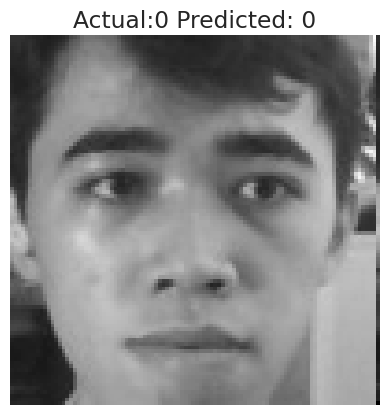

In [42]:
# Verify
rand_n = np.random.randint(X_test.shape[0])
plt.imshow(X_test[rand_n][:, :, 0], cmap='gray')
plt.title(f'Actual:{np.argmax(y_test[rand_n])} Predicted: {np.argmax(model.predict(X_test[rand_n].reshape(-1, 100, 100, 1)))}');
plt.axis('off')
plt.show()

In [43]:
def plot_predictions(r=5 ,c =5):
  w=10
  h=10
  fig=plt.figure(figsize=(12, 12))
  columns = c
  rows = r
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      rand_n = np.random.randint(X_test.shape[0])
      plt.imshow(X_test[rand_n][:, :, 0], cmap='gray')
      plt.title(f'Actual:{np.argmax(y_test[rand_n])} Pre: {np.argmax(model.predict(X_test[rand_n].reshape(-1, 100, 100, 1)))}');
      plt.axis('off')
  plt.show()

1/1 [==============================] - 0s 18ms/step


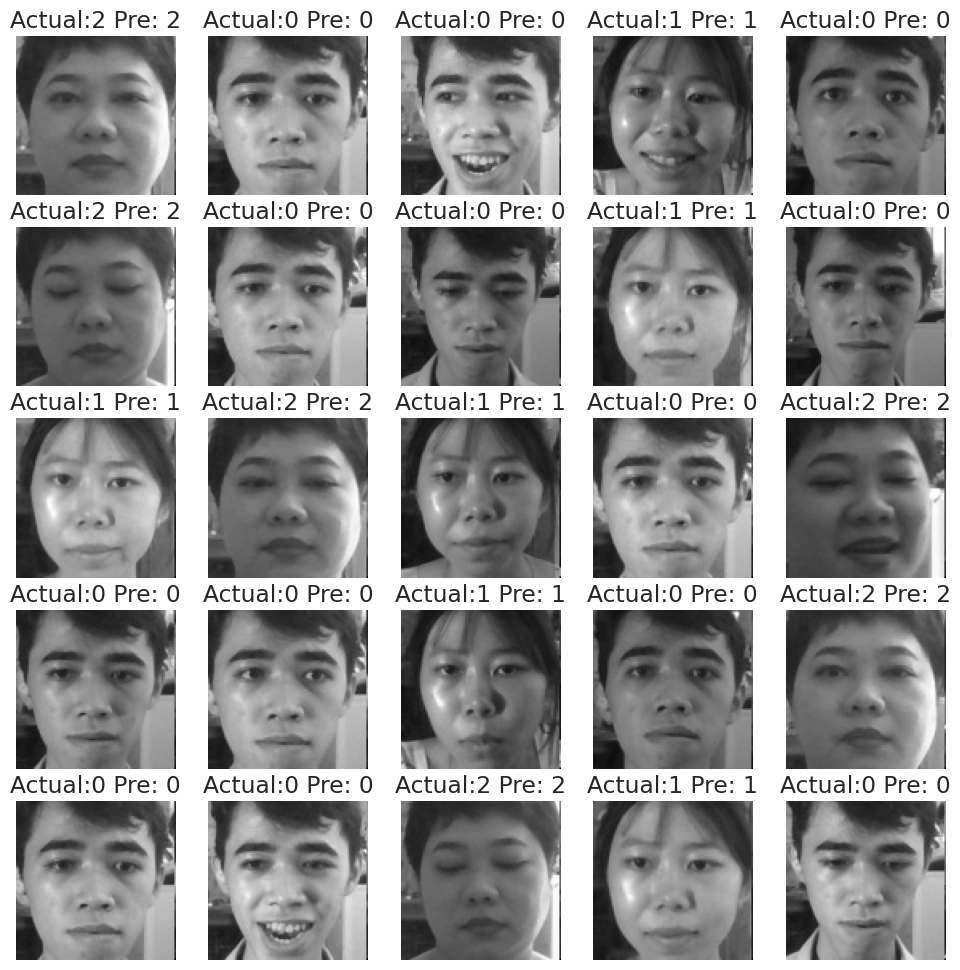

In [44]:
plot_predictions()

In [45]:
# serialize weights to HDF5
model.save(model_name+".h5")
print("Model Saved to disk")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model Saved to disk


In [57]:
# Loding model from disk
from tensorflow.keras.models import load_model
model1 = load_model('/content/drive/MyDrive/ProjectFaces/Face_trained_model_08_46_37_.h5')

In [58]:
loss, acc = model1.evaluate(valid_datagen.flow(X_test, y_test))

53/53 [==============================] - 1s 7ms/step - loss: 0.1085 - accuracy: 0.9988


In [59]:
from sklearn.metrics import classification_report

print(classification_report(np.argmax(y_test, axis=1), np.argmax(model1.predict(X_test), axis=1)))

53/53 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       577
           1       0.96      1.00      0.98       507
           2       1.00      0.91      0.95       581

    accuracy                           0.96      1665
   macro avg       0.96      0.96      0.96      1665
weighted avg       0.96      0.96      0.96      1665



In [60]:
ls models/

Face_trained_model_08_26_40_.h5  Face_trained_model_09_21_20_.h5  Face_trained_model_12_19_01_.h5
Face_trained_model_08_35_31_.h5  Face_trained_model_10_43_30_.h5  Face_trained_model_12_30_30_.h5
Face_trained_model_08_44_03_.h5  Face_trained_model_11_47_22_.h5  Face_trained_model_12_41_21_.h5
Face_trained_model_08_45_23_.h5  Face_trained_model_11_49_55_.h5  Face_trained_model_12_55_39_.h5
Face_trained_model_08_46_37_.h5  Face_trained_model_12_17_14_.h5  Face_trained_model_12_58_43_.h5


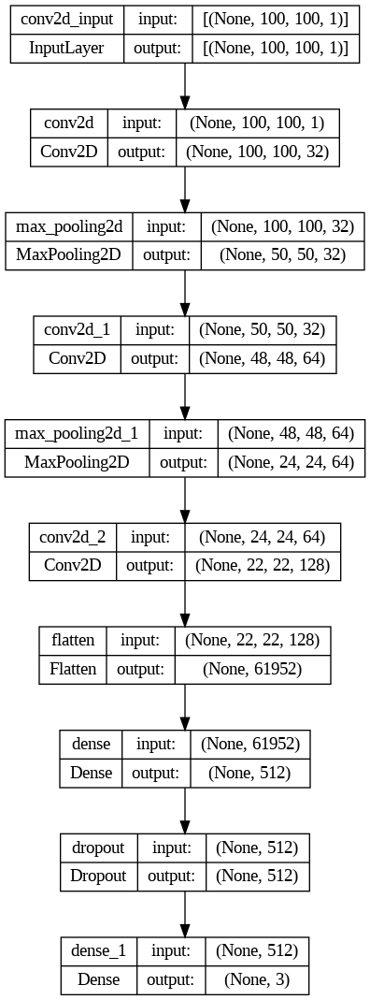

In [61]:
tf.keras.utils.plot_model(
    model1,
    to_file='model_with_shapes.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96
)

## Intermediate layer visualization of the CNN

In [62]:
model1.summary()

Model: "Face_trained_model_08_46_37_"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 100, 100, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 50, 50, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 48, 48, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 24, 24, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 128)       73856     
                                                                 
 flatten (Flatten)           (None, 61

In [63]:
from tensorflow.keras.models import Model
layer_outputs = [layer.output for layer in model1.layers[:20]]
activation_model = Model(inputs=model1.input, outputs=layer_outputs)

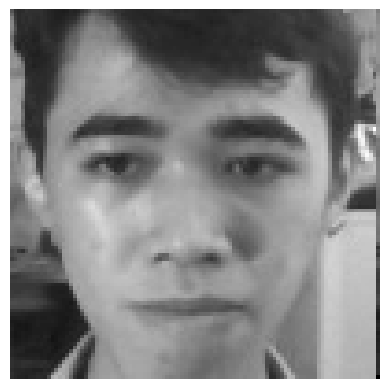

In [64]:
plt.imshow(X_test[28][:,:,0], cmap='gray');
plt.axis('off');

In [65]:
activations = activation_model.predict(X_test[28].reshape(-1, 100, 100, 1))

1/1 [==============================] - 0s 89ms/step


In [66]:
count =0
for layer in activations:
  count+=1
  print('Layer:%2d    Shape: %s ' %(count, str(layer.shape)))

Layer: 1    Shape: (1, 100, 100, 32) 
Layer: 2    Shape: (1, 50, 50, 32) 
Layer: 3    Shape: (1, 48, 48, 64) 
Layer: 4    Shape: (1, 24, 24, 64) 
Layer: 5    Shape: (1, 22, 22, 128) 
Layer: 6    Shape: (1, 61952) 
Layer: 7    Shape: (1, 512) 
Layer: 8    Shape: (1, 512) 
Layer: 9    Shape: (1, 3) 


<ipython-input-67-43acc80bc027>:16: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
<ipython-input-67-43acc80bc027>:19: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


MemoryError: Unable to allocate 1.69 PiB for an array with shape (239878144, 991232) and data type float64

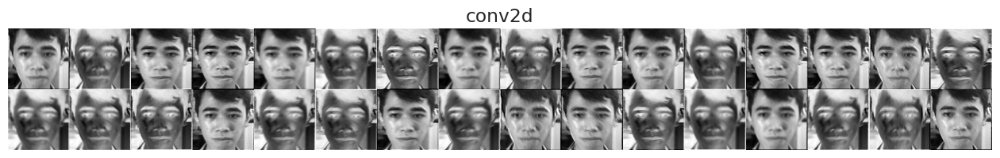

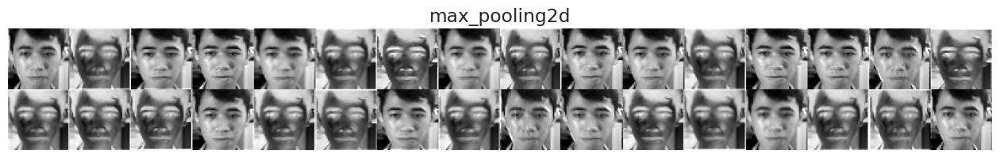

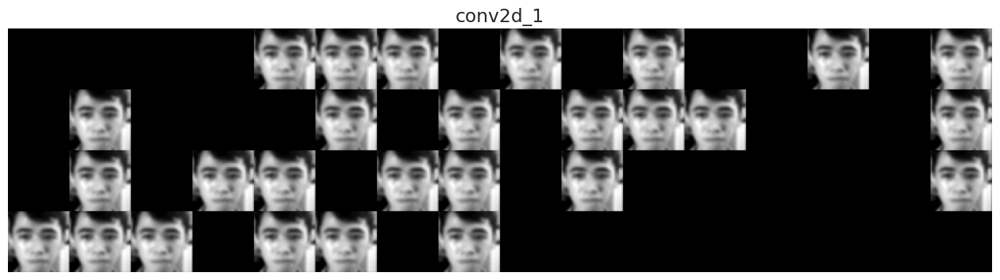

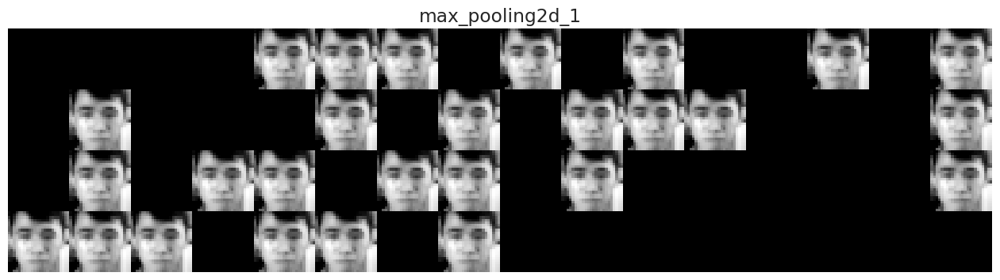

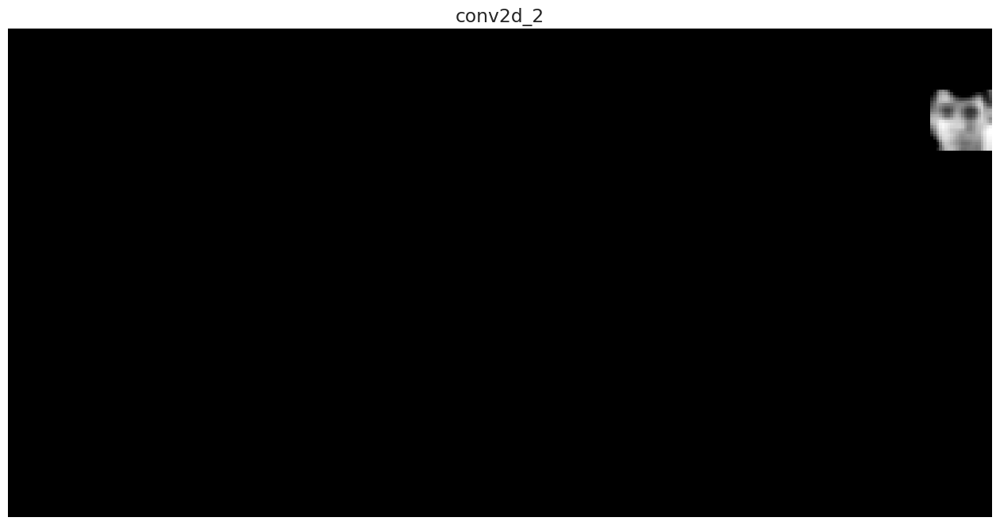

In [67]:
layer_names = []
for layer in model1.layers[:20]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big  horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(display_grid, aspect='auto', cmap='gray')
    plt.savefig(layer_name+'.png')

In [ ]:
#   # serialize model to JSON
# model_json = model1.to_json()
# with open("model.json", "w") as json_file:
#     json_file.write(model_json)

Data Agumentation

In [ ]:
def plot_aug(data, y_true, model, r=5, c=5):
    w = 10
    h = 10
    fig = plt.figure(figsize=(12, 12))
    columns = c
    rows = r
    for i in range(1, columns * rows + 1):
        rand_n = np.random.randint(data.shape[0])
        prediction = np.argmax(model1.predict(data[rand_n].reshape(-1, 100, 100, 1)))
        fig.add_subplot(rows, columns, i)
        plt.imshow(data[rand_n], cmap='gray')
        plt.title(f'Act: {np.argmax(y_true[rand_n])} Pre: {prediction}')
        plt.axis('off')
    plt.show()

# Sử dụng hàm plot_aug() để hiển thị và so sánh dự đoán với nhãn thực tế
plot_aug(X_test, y_test, model)


In [ ]:
# plt.imshow(au_x[0], cmap='gray')
# plt.axis('off')
data = ImageDataGenerator(rescale=1./255.,
                                  #  rotation_range=10,
                                  #  width_shift_range=0.25,
                                  #  height_shift_range=0.25,
                                  #  shear_range=0.1,
                                   zoom_range=0.25,
                                  #  horizontal_flip=False
                          ).flow(X_train, y_train)
au_x, au_y = data.next()[0].reshape(32,100,100), data.next()[1]
au_x.shape, au_y.shape
plot_aug(au_x)

In [ ]:
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf

def load_and_predict(image_path):
    # Đọc ảnh từ đường dẫn và chuyển đổi thành grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize ảnh thành kích thước 100x100
    resized_image = cv2.resize(image, (100, 100))

    # Thực hiện dự đoán trên ảnh đã được xử lý
    prediction = model1.predict(resized_image.reshape(-1, 100, 100, 1))

    # Chuyển đổi dự đoán thành xác suất bằng hàm softmax
    probabilities = tf.nn.softmax(prediction).numpy()

    # Hiển thị ảnh và xác suất dự đoán cho mỗi lớp
    plt.imshow(resized_image, cmap='gray')
    plt.title('Probabilities:')
    plt.axis('off')

    # In ra xác suất của mỗi lớp
    for i, prob in enumerate(probabilities[0]):
        plt.text(10, 10 + i * 20, f'Class {i}: {prob:.4f}', color='white')

    plt.show()

    return probabilities

image_path = '/content/drive/MyDrive/Datasets/Face Recognition Dataset/Faces/Faces/Akshay Kumar_0.jpg'
# Gọi hàm với đường dẫn đến ảnh bạn muốn dự đoán
probabilities = load_and_predict(image_path)
image_path = '/content/drive/MyDrive/Datasets/Face Recognition Dataset/Faces/Faces/Alexandra Daddario_42.jpg'
probabilities = load_and_predict(image_path)
image_path = '/content/drive/MyDrive/Datasets/Datasets/preprocessed_faces/test/PhamNguyen/face_0_image_17.jpg'
probabilities = load_and_predict(image_path)
image_path = '/content/drive/MyDrive/Datasets/Datasets/preprocessed_faces/test/PhamNguyen/face_0_image_42.jpg'
probabilities = load_and_predict(image_path)


In [ ]:
def load_and_predict(image_path):
    # Đọc ảnh từ đường dẫn và chuyển đổi thành grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize ảnh thành kích thước 100x100
    resized_image = cv2.resize(image, (100, 100))

    # Thực hiện dự đoán trên ảnh đã được xử lý
    predictions = model.predict(resized_image.reshape(-1, 100, 100, 1))
    predicted_class = np.argmax(predictions)
    confidence = np.max(predictions) * 100  # Tính phần trăm chính xác

    # Hiển thị ảnh và kết quả dự đoán
    plt.imshow(resized_image, cmap='gray')
    plt.title(f'Prediction: {predicted_class} with confidence: {confidence:.2f}%')
    plt.axis('off')
    plt.show()

image_path = '/content/drive/MyDrive/Datasets/Face Recognition Dataset/Faces/Faces/Alexandra Daddario_42.jpg'
# Gọi hàm với đường dẫn đến ảnh bạn muốn dự đoán
load_and_predict(image_path)

